# 06 Evaluation and Explainability

This notebook presents the final, post-selection evaluation of the locked
Baseline Custom CNN, partially fine-tuned MobileNetV2, and partially fine-tuned
ResNet18. All models use the corrected 30-class Leafsnap subset and the same
1,001-image test split. The notebook does not train, tune, or select a model
from test performance.

## 1. Setup

The analysis reads immutable checkpoints, saved per-image predictions, and the
shared class mapping. Generated tables and figures are stored under
`outputs/comparison/`; report-ready copies are stored under `reports/`. The
checkpoint hashes recorded in the handoff manifests are used to identify the
evaluated models.

In [1]:
import json
import sys
from pathlib import Path

import torch
from IPython.display import Image as NotebookImage, display

REPO_ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from src.evaluation.confusion import strongest_confusion_pairs
from src.evaluation.error_analysis import low_confidence_correct, top_errors
from src.evaluation.metrics import classification_metrics_from_logits, metrics_by_source

OUTPUT_ROOT = REPO_ROOT / "outputs"
COMPARISON_DIR = OUTPUT_ROOT / "comparison"
COMPARISON_DIR.mkdir(parents=True, exist_ok=True)
print(f"Repository: {REPO_ROOT}")


Repository: /Users/charleslee/Documents/GitHub/COMP9444-Tree-Species-Classification


## 2. Locked Evaluation Inputs

The corrected dataset contains 6,757 images divided into 4,734 training, 1,022
validation, and 1,001 test images. The test split contains 760 laboratory and
241 field images. All three handoffs use the same contiguous 30-class mapping
and the same ordered test paths. Model selection was completed using validation
performance before any final test analysis.

In [2]:
expected_inputs = {
    "baseline": OUTPUT_ROOT / "baseline",
    "mobilenetv2": OUTPUT_ROOT / "mobilenetv2",
    "resnet18": OUTPUT_ROOT / "resnet18",
}

for model_name, model_dir in expected_inputs.items():
    checkpoints = sorted(model_dir.rglob("*.pt")) if model_dir.exists() else []
    print(f"{model_name}: {len(checkpoints)} checkpoint(s)")
    for checkpoint in checkpoints:
        print(f"  {checkpoint.relative_to(REPO_ROOT)}")


baseline: 1 checkpoint(s)
  outputs/baseline/member5_handoff/best_custom_cnn.pt
mobilenetv2: 1 checkpoint(s)
  outputs/mobilenetv2/member5_handoff/checkpoint/best_mobilenetv2_partial.pt
resnet18: 1 checkpoint(s)
  outputs/resnet18/member5_handoff/checkpoint/best_model.pt


## 3. Unified Metrics

Accuracy, Macro-F1, Weighted-F1, Top-5 accuracy, per-class metrics, and
lab/field metrics are recomputed from traceable per-image predictions.

**Reporting policy.** Headline test accuracy uses the model owner's locked
result: 80.52% for the Baseline, 93.81% for MobileNetV2, and 97.10% for
ResNet18. Detailed Baseline analysis uses the locally regenerated prediction
file, which gives 80.42% and differs by one image. The brightness experiment is
a separate local post-hoc rerun and measures every change relative to that
model's local brightness-1.0 result. These values are not interchangeable.

In [3]:
import csv

summary_paths = sorted(COMPARISON_DIR.glob("*/analysis_summary.json"))
model_summaries = {}
for summary_path in summary_paths:
    summary = json.loads(summary_path.read_text(encoding="utf-8"))
    model_summaries[summary["model"]] = summary

with (COMPARISON_DIR / "model_comparison.csv").open(
    "r", encoding="utf-8", newline=""
) as csv_file:
    comparison_rows = list(csv.DictReader(csv_file))

print(
    f"{'model':<26} {'headline_acc':>14} {'local_acc':>12} "
    f"{'macro_f1':>12} {'weighted_f1':>14} {'top5':>10}"
)
for row in comparison_rows:
    print(
        f"{row['model']:<26} "
        f"{float(row['owner_reported_accuracy']):>14.4f} "
        f"{float(row['accuracy']):>12.4f} "
        f"{float(row['macro_f1']):>12.4f} "
        f"{float(row['weighted_f1']):>14.4f} "
        f"{float(row['top5_accuracy']):>10.4f}"
    )

model                        headline_acc    local_acc     macro_f1    weighted_f1       top5
Baseline-CustomCNN                 0.8052       0.8042       0.8084         0.8009     0.9860
MobileNetV2-Partial                0.9381       0.9381       0.9399         0.9380     1.0000
ResNet18-Layer4                    0.9710       0.9710       0.9722         0.9711     0.9980


## 4. Model Comparison

ResNet18 is the strongest overall model, reaching 97.10% Accuracy, 97.22%
Macro-F1, 97.11% Weighted-F1, and 99.80% Top-5 accuracy. MobileNetV2 ranks
second with 93.81% Accuracy and 93.99% Macro-F1, while the Baseline reaches an
owner-reported 80.52% Accuracy. The close agreement between Accuracy and
Macro-F1 for both transfer models indicates that their gains are not confined
to only the largest classes. ResNet18 is therefore selected as the final model;
MobileNetV2 remains a substantially smaller alternative.

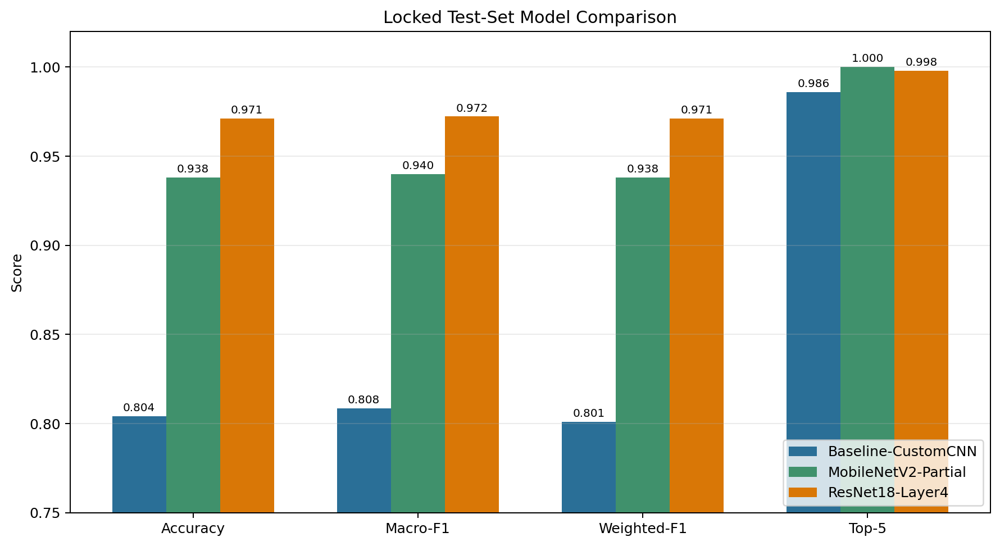

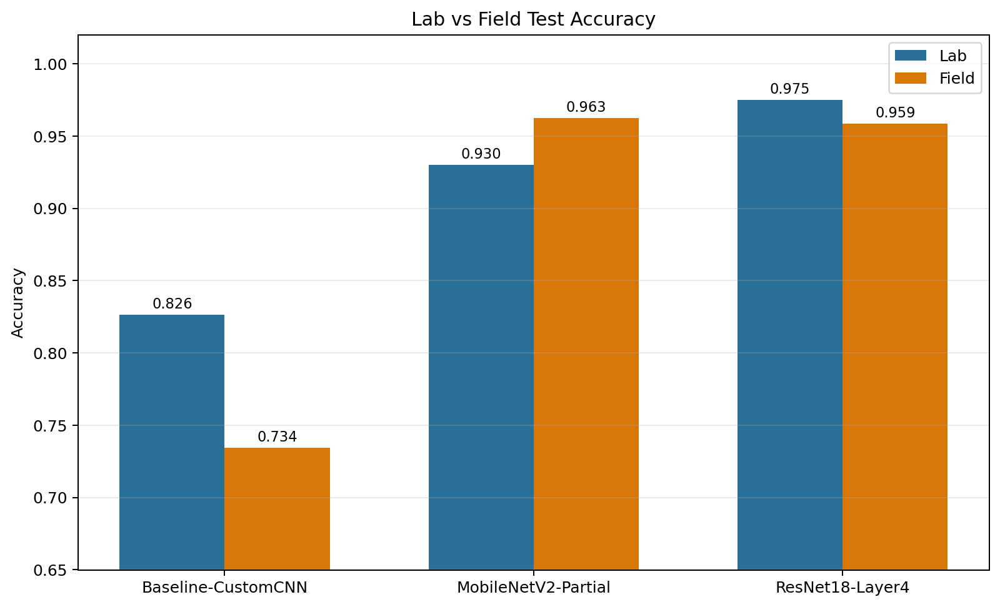

In [4]:
REPORT_FIGURE_DIR = REPO_ROOT / "reports" / "figures"
display(NotebookImage(filename=str(REPORT_FIGURE_DIR / "model_comparison.png")))
display(NotebookImage(filename=str(REPORT_FIGURE_DIR / "source_comparison.png")))

## 5. Confusion Matrix and Per-class Results

The final ResNet18 model correctly classifies 972 of 1,001 test images. Its
weakest class is `ulmus_americana` (F1 = 85.71%), followed by
`diospyros_virginiana` (92.50%) and `ostrya_virginiana` (92.54%). The strongest
two-way confusion is `ulmus_americana` versus `ulmus_rubra`, with five errors
in total. Four additional `ulmus_americana` images are predicted as
`ostrya_virginiana`. These errors are consistent with fine-grained visual
similarity among simple, serrated leaves rather than broad failure across the
30 classes.

baseline confusion_matrix_normalized.png


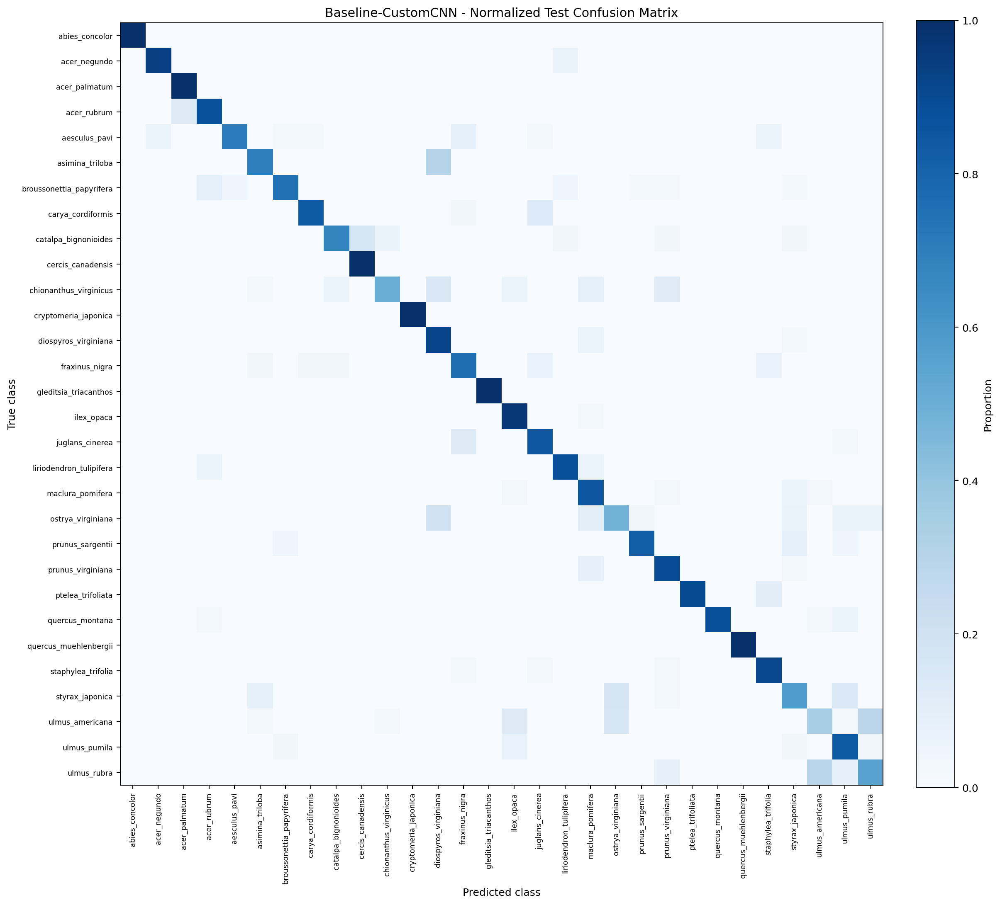

baseline confusion_matrix_raw.png


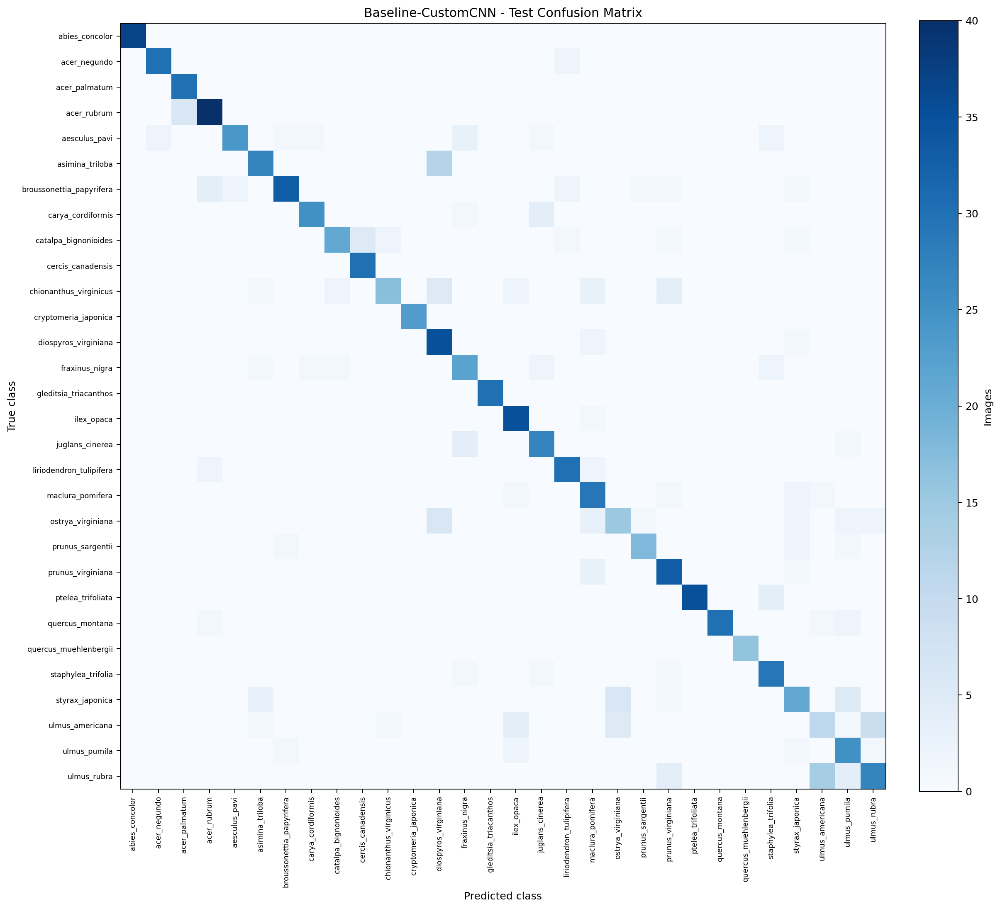

mobilenetv2 confusion_matrix_normalized.png


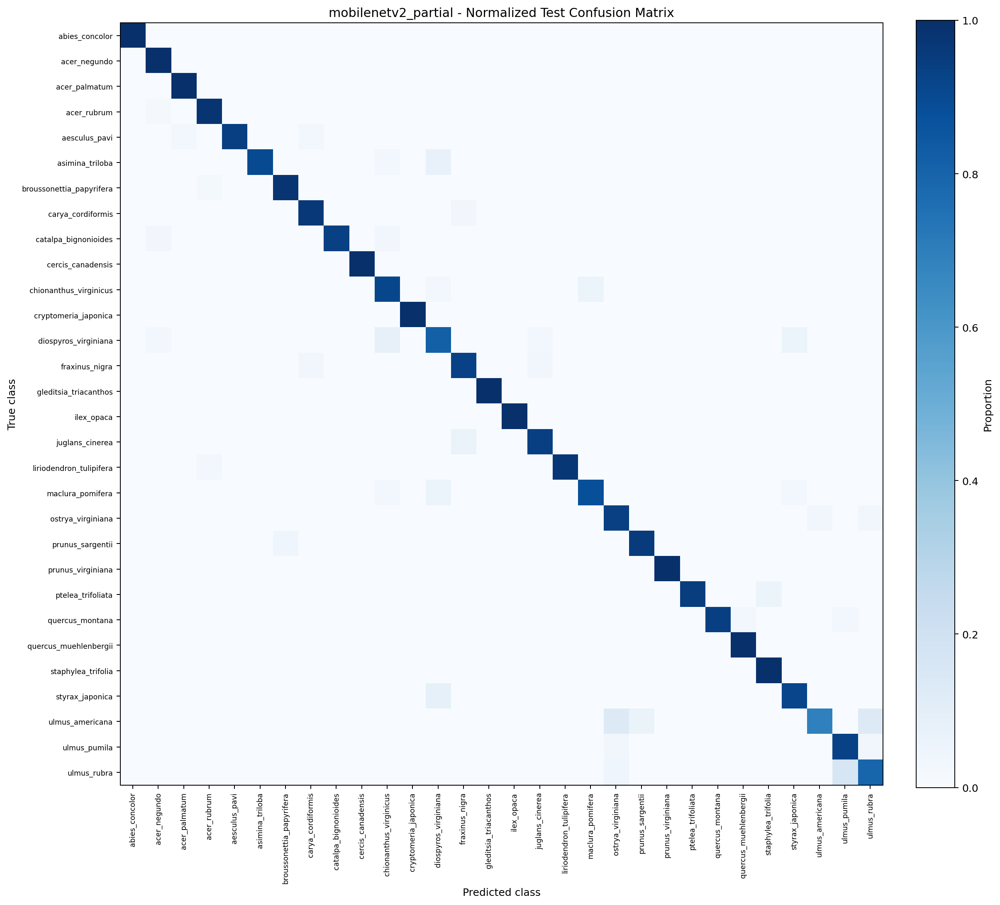

mobilenetv2 confusion_matrix_raw.png


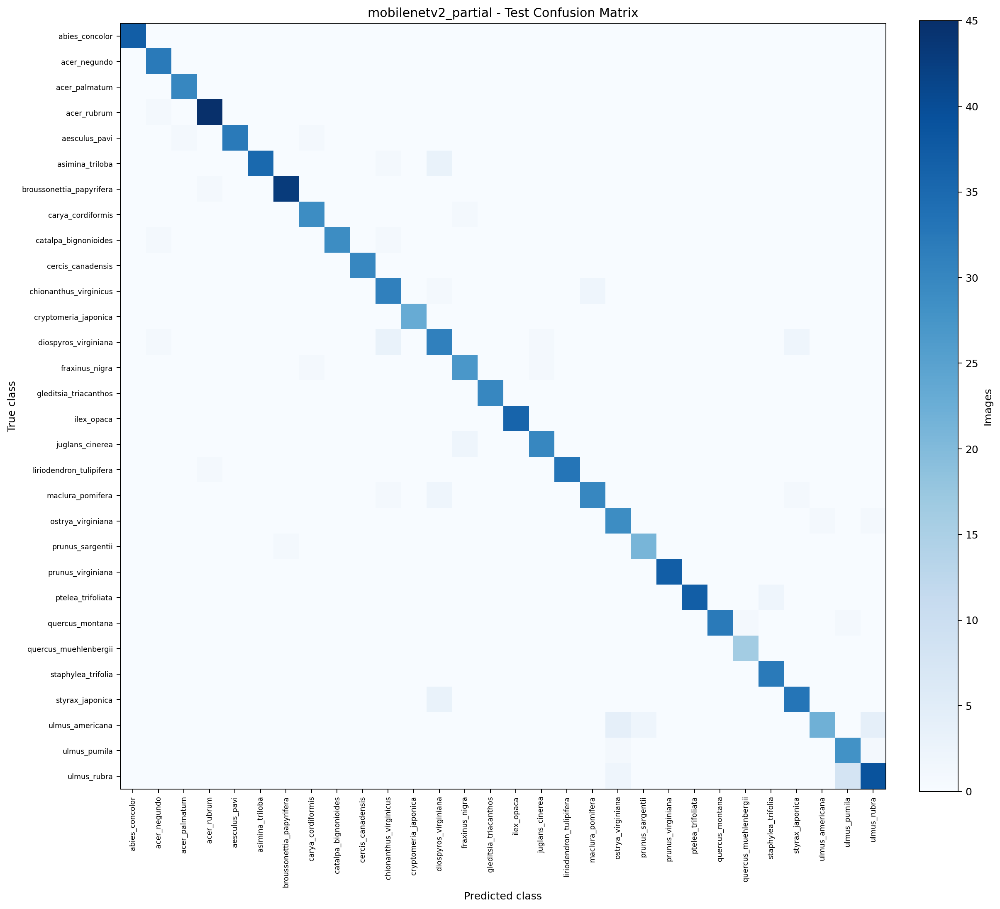

resnet18 confusion_matrix_normalized.png


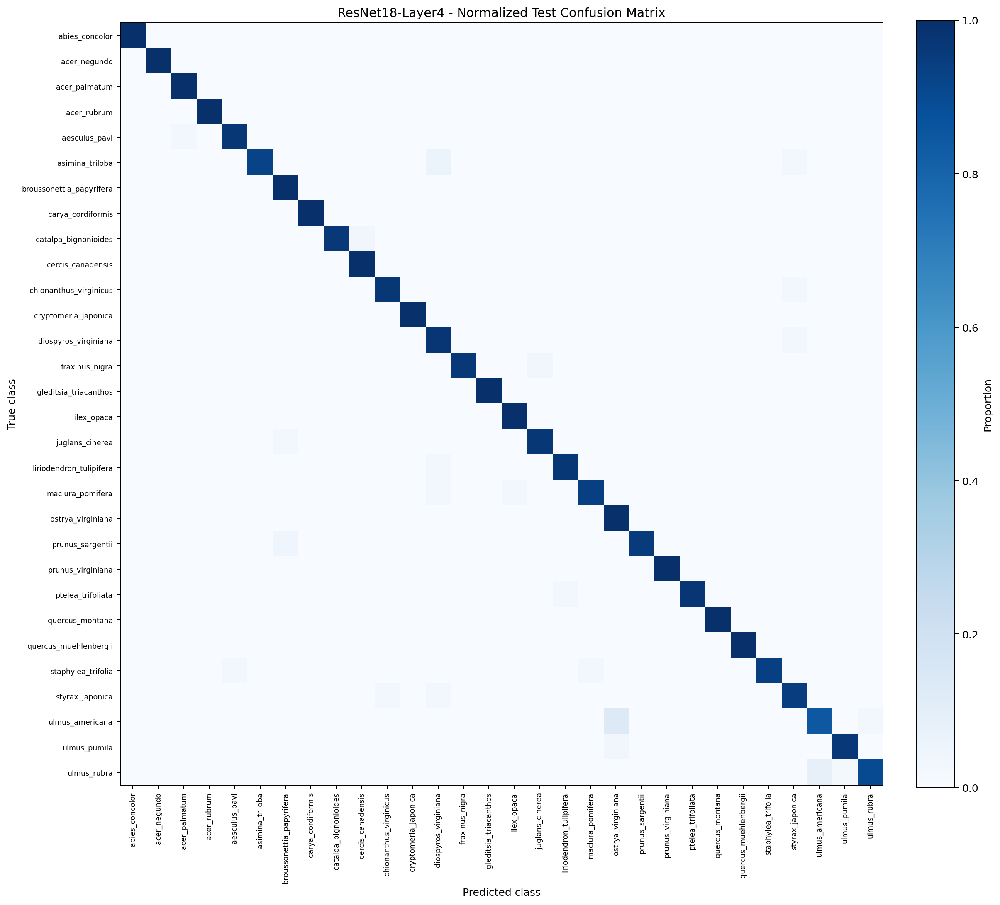

resnet18 confusion_matrix_raw.png


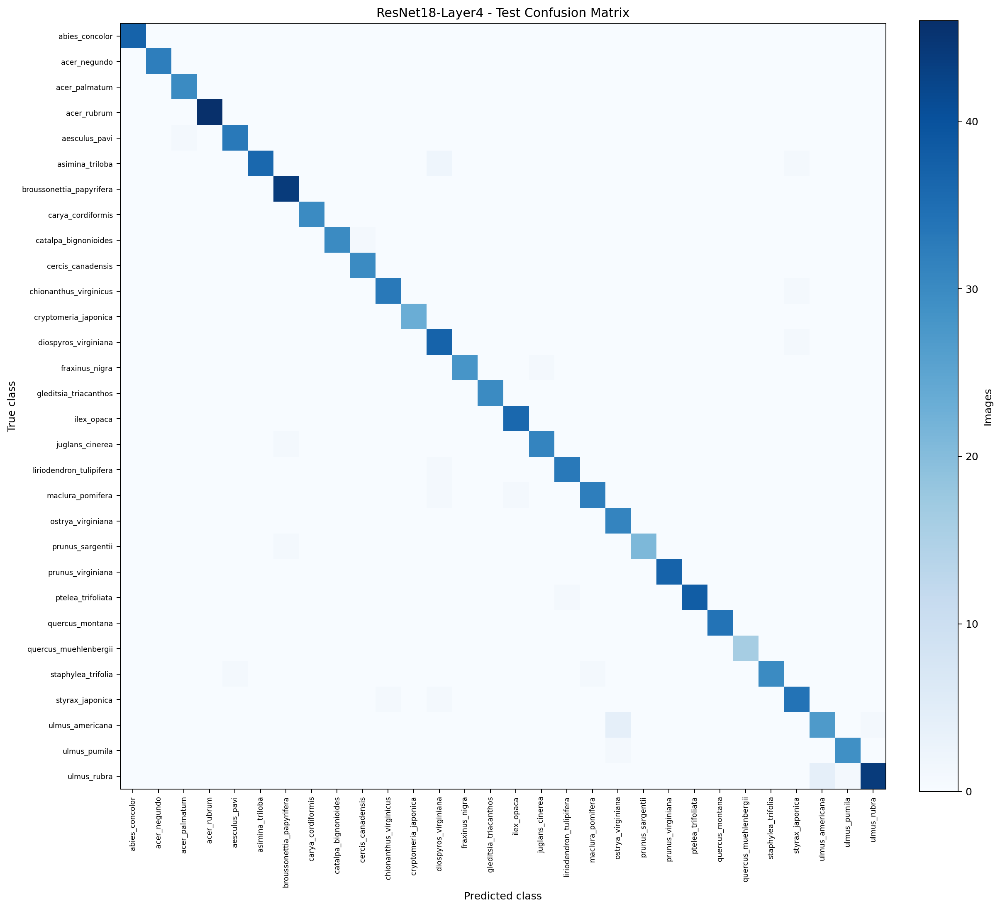

In [5]:
for image_path in sorted(COMPARISON_DIR.glob("*/confusion_matrix_*.png")):
    print(image_path.parent.name, image_path.name)
    display(NotebookImage(filename=str(image_path), width=800))


## 6. Lab vs Field and Illumination Robustness

The Baseline falls from 82.63% lab accuracy to 73.44% field accuracy, a
9.19-point gap, showing limited robustness to real backgrounds and acquisition
conditions. ResNet18 retains 97.50% lab and 95.85% field accuracy, reducing the
gap to 1.65 points. MobileNetV2 records 93.03% lab and 96.27% field accuracy.
The apparent field advantage for MobileNetV2 should not be treated as proof
that field images are easier because the field subset contains only 241 images
and 29 represented classes, compared with 760 lab images and all 30 classes.

In [6]:
for model_name, summary in model_summaries.items():
    print(f"\n{model_name}")
    for source, metrics in summary["source_metrics"].items():
        print(
            f"  {source}: images={metrics['num_samples']}, "
            f"accuracy={metrics['accuracy']:.4f}, "
            f"macro_f1={metrics['macro_f1']:.4f}, "
            f"covered_classes={metrics['classes_with_support']}"
        )



Baseline-CustomCNN
  lab: images=760, accuracy=0.8263, macro_f1=0.8263, covered_classes=30
  field: images=241, accuracy=0.7344, macro_f1=0.6920, covered_classes=29

mobilenetv2_partial
  lab: images=760, accuracy=0.9303, macro_f1=0.9301, covered_classes=30
  field: images=241, accuracy=0.9627, macro_f1=0.9644, covered_classes=29

ResNet18-Layer4
  lab: images=760, accuracy=0.9750, macro_f1=0.9763, covered_classes=30
  field: images=241, accuracy=0.9585, macro_f1=0.9499, covered_classes=29


## 7. Model Efficiency

Compare parameter count, checkpoint size, batch-one latency, and batch
throughput under one shared CPU protocol. Timings cover the model forward pass
only; they exclude image decoding, preprocessing, and file I/O. Each model
retains its locked deployment input resolution.

model                          params    size_mb    batch1_ms    batch32_img_s
Baseline-CustomCNN              1.21M       4.87         7.73            80.32
MobileNetV2-Partial             2.26M       9.30        57.85            22.98
ResNet18-Layer4                11.19M      44.85        17.52            37.20


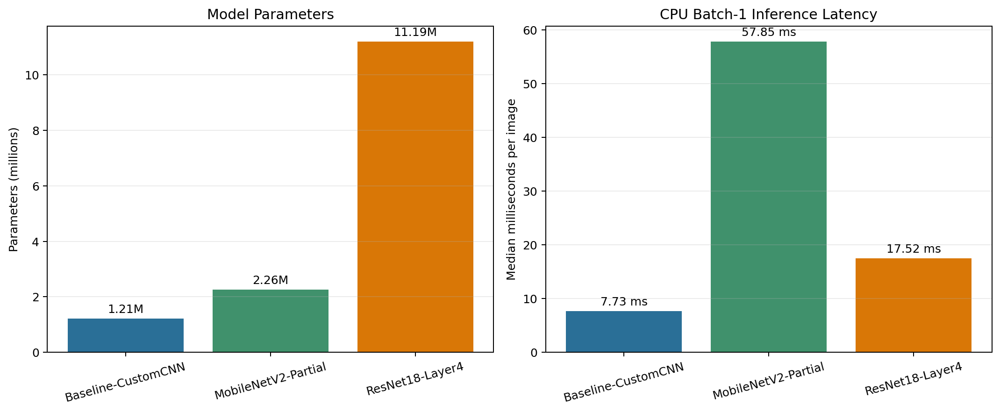

In [7]:
import csv
from IPython.display import Image, display

EXPERIMENT_DIR = COMPARISON_DIR / "experiments"

with (EXPERIMENT_DIR / "model_efficiency.csv").open(
    "r", encoding="utf-8", newline=""
) as csv_file:
    efficiency_rows = list(csv.DictReader(csv_file))

print(
    f"{'model':<26} {'params':>10} {'size_mb':>10} "
    f"{'batch1_ms':>12} {'batch32_img_s':>16}"
)
for row in efficiency_rows:
    print(
        f"{row['model']:<26} "
        f"{int(row['total_parameters']) / 1_000_000:>9.2f}M "
        f"{float(row['checkpoint_size_mb']):>10.2f} "
        f"{float(row['batch1_median_latency_ms']):>12.2f} "
        f"{float(row['batch_throughput_images_per_second']):>16.2f}"
    )

display(Image(filename=str(EXPERIMENT_DIR / "model_efficiency.png")))

## 8. Brightness Robustness

Apply deterministic global RGB brightness factors of 0.6, 0.8, 1.0, 1.2,
and 1.4 to every locked test image before the model-specific resize and
normalization. Checkpoints remain frozen. Report changes relative to each
model's local 1.0 run and retain lab/field results. This is a controlled stress
test, not a complete simulation of real-world illumination.

model                          clean   perturbed_mean   worst_factor   max_drop
Baseline-CustomCNN            0.8042           0.6666            0.6     0.3037
MobileNetV2-Partial           0.9381           0.9228            1.4     0.0280
ResNet18-Layer4               0.9700           0.9543            1.4     0.0250


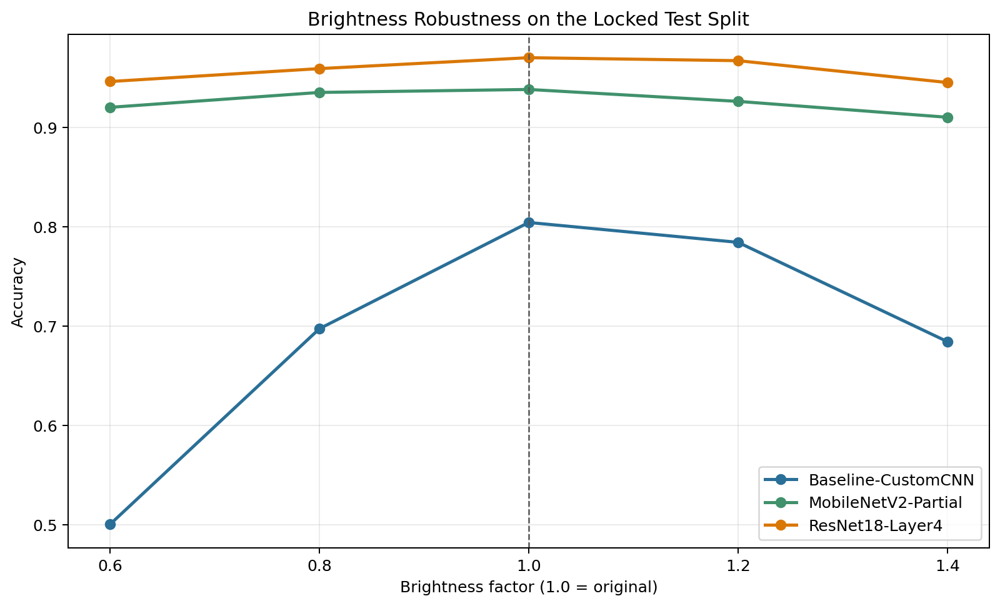

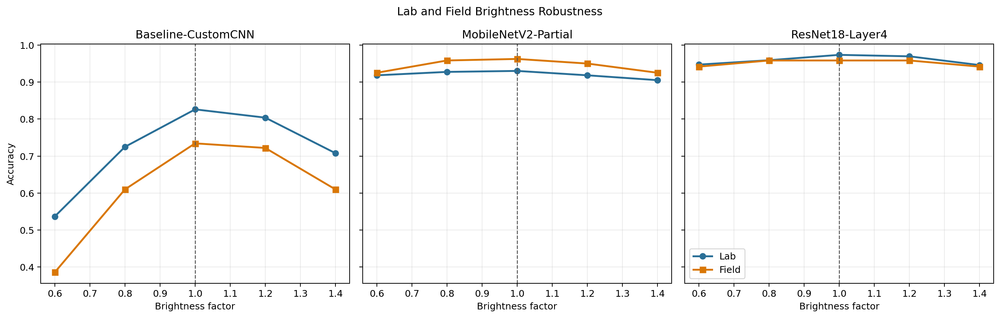

In [8]:
with (EXPERIMENT_DIR / "brightness_robustness_summary.csv").open(
    "r", encoding="utf-8", newline=""
) as csv_file:
    brightness_summary = list(csv.DictReader(csv_file))

print(
    f"{'model':<26} {'clean':>9} {'perturbed_mean':>16} "
    f"{'worst_factor':>14} {'max_drop':>10}"
)
for row in brightness_summary:
    print(
        f"{row['model']:<26} "
        f"{float(row['clean_accuracy']):>9.4f} "
        f"{float(row['mean_perturbed_accuracy']):>16.4f} "
        f"{float(row['worst_brightness_factor']):>14.1f} "
        f"{float(row['maximum_accuracy_drop']):>10.4f}"
    )

display(Image(filename=str(EXPERIMENT_DIR / "brightness_robustness.png")))
display(
    Image(filename=str(EXPERIMENT_DIR / "brightness_source_robustness.png"))
)

## 9. Error Analysis

The highest-confidence errors reveal two recurring patterns. First, visually
similar taxa remain difficult: all three models confuse members of the
`Ulmus` group with each other or with `ostrya_virginiana`. ResNet18 predicts one
`ulmus_americana` image as `ostrya_virginiana` with 99.55% confidence and one
`ulmus_pumila` field image as the same class with 94.28% confidence. Second,
scale and framing matter. A laboratory `liriodendron_tulipifera` image contains
only a small partial leaf near the image boundary and is confidently
misclassified by all three models. These high-confidence errors indicate that
confidence alone is not a reliable failure detector and motivate calibration
or uncertainty-aware review.

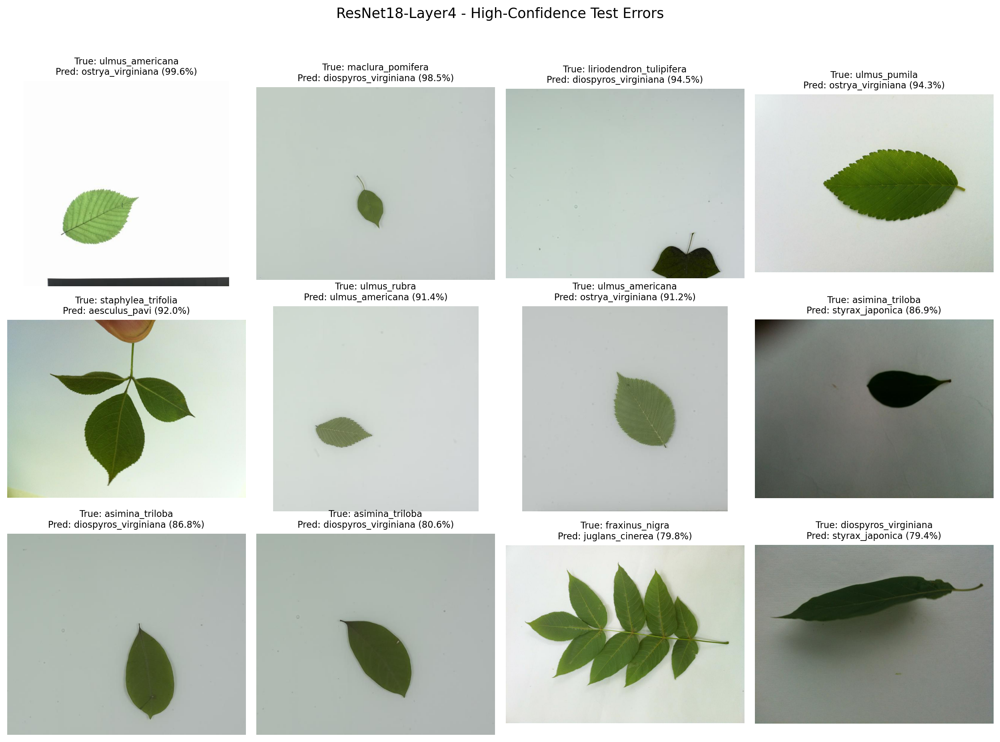

In [9]:
display(
    NotebookImage(filename=str(REPORT_FIGURE_DIR / "resnet18_error_cases.png"))
)

## 10. Grad-CAM

Grad-CAM explains the predicted class using `model.features[3][3]` for the
Baseline, `model.features[-1]` for MobileNetV2, and `model.layer4[-1]` for
ResNet18. Correct examples generally activate over the leaf body, outline,
central vein, and compound-leaf arrangement rather than only the surrounding
background. In incorrect `Ulmus` examples, the heatmaps still cover meaningful
leaf regions, suggesting that the model sees the object but maps shared
morphology to the wrong species. The cropped `liriodendron_tulipifera` example
shows attention split between the small visible leaf and image boundaries,
illustrating sensitivity to framing. Grad-CAM is qualitative evidence of
attention location, not proof that a highlighted feature causally determines
the prediction.

baseline Grad-CAM


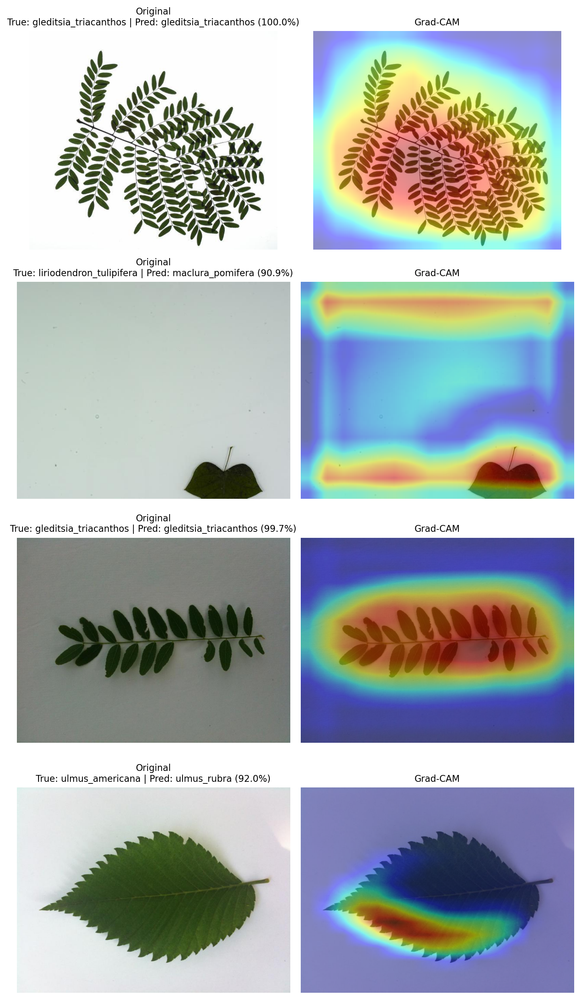

mobilenetv2 Grad-CAM


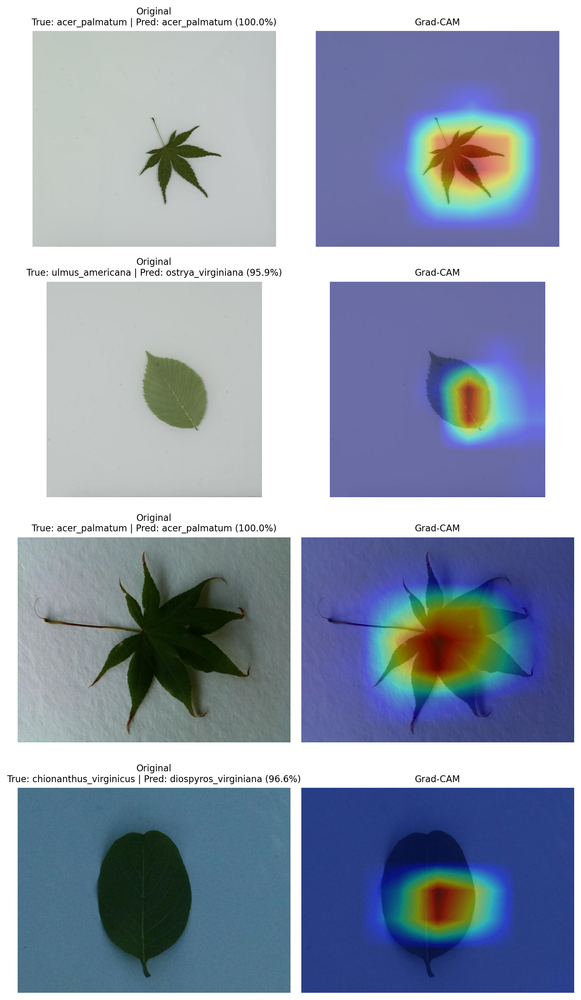

resnet18 Grad-CAM


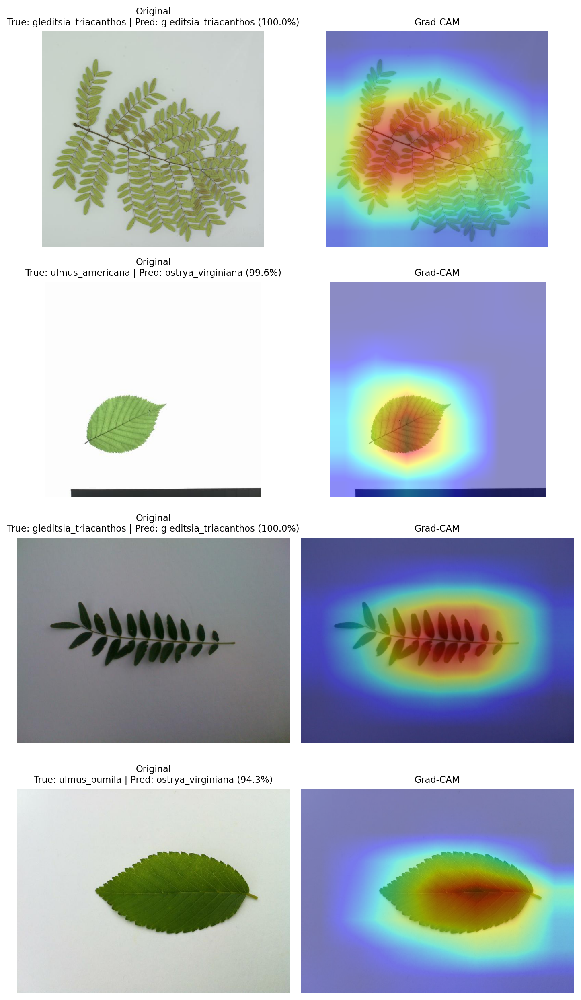

In [10]:
for model_name in ("baseline", "mobilenetv2", "resnet18"):
    print(f"{model_name} Grad-CAM")
    display(
        NotebookImage(
            filename=str(
                REPORT_FIGURE_DIR / f"{model_name}_gradcam_examples.png"
            )
        )
    )

## 11. Discussion

Transfer learning produces the main performance gain. ResNet18 improves
headline accuracy by 16.58 points over the Baseline and by 3.30 points over
MobileNetV2 while maintaining the strongest Macro-F1 and field result. Its
residual representation appears better able to preserve fine-grained shape and
texture cues under source and brightness changes. MobileNetV2 offers a much
smaller checkpoint with only a modest accuracy reduction, making it attractive
when storage matters, although it is not the fastest model on the tested CPU.

The remaining errors are concentrated in morphologically similar species,
especially `Ulmus`, rather than spread uniformly across classes. The Baseline's
large lab-to-field gap and severe darkening failure suggest greater dependence
on the controlled acquisition style. The transfer models generalize more
consistently, but their high-confidence mistakes show that deployment should
still expose confidence and support expert review for ambiguous leaves.

## 12. Limitations and Future Work

The test set is internal to the same Leafsnap subset used for model
development, so external geographic and device generalization remains unknown.
Only 241 field images and 29 field classes are represented, which limits source
comparisons. Global brightness is a simplified illumination proxy and does not
cover shadows, glare, white-balance shifts, blur, occlusion, or seasonal
variation. CPU latency is measured on one machine and cannot predict mobile,
CUDA, or optimized-runtime performance. Grad-CAM examples are qualitative and
do not establish causal feature use. Finally, cross-platform inference changes
one Baseline and one ResNet18 clean prediction, so owner-reported headline
metrics and local stress-test baselines are kept explicitly separate.

Future work should collect a larger external field set, evaluate calibration,
add controlled shadow and color-shift tests, investigate class-balanced or
metric-learning objectives for similar species, and benchmark exported models
on the intended deployment hardware.

## 13. Conclusion

ResNet18 is the recommended final model. It achieves 97.10% test accuracy,
97.22% Macro-F1, 95.85% field accuracy, and the smallest observed maximum
brightness drop at 2.50 percentage points. MobileNetV2 provides a compact
alternative at 93.81% accuracy, while the Baseline is smaller and faster but
substantially less accurate and less robust. The principal unresolved failure
mode is confident confusion among visually similar species, especially
`Ulmus`, which should guide future data collection and uncertainty-aware
deployment.